In [210]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import pandas.plotting as pd_plt
import matplotlib.colors as plt_colors
from IPython.display import display
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, KFold
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler, Normalizer
from sklearn.metrics import classification_report
from sklearn.metrics import make_scorer, precision_score, recall_score, confusion_matrix, classification_report
from IPython.display import display_html
from sklearn.compose import ColumnTransformer
from sklearn.compose import make_column_selector
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, IterativeImputer, KNNImputer
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV, validation_curve, train_test_split, KFold,GridSearchCV, StratifiedKFold, RepeatedStratifiedKFold, TunedThresholdClassifierCV, cross_validate
from sklearn.svm import SVC
from sklearn.preprocessing import OrdinalEncoder,LabelEncoder, OneHotEncoder, TargetEncoder
from sklearn.preprocessing import PolynomialFeatures, QuantileTransformer, PowerTransformer
from sklearn.model_selection import train_test_split 
from sklearn.compose import ColumnTransformer, make_column_transformer, TransformedTargetRegressor
from sklearn.metrics import fbeta_score
from sklearn.datasets import load_breast_cancer
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import confusion_matrix, precision_score, recall_score, make_scorer
import category_encoders as ce
from sklearn.experimental import enable_iterative_imputer
from sklearn.metrics import mean_absolute_percentage_error
from matplotlib.colors import ListedColormap
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from IPython.display import display
from matplotlib.colors import ListedColormap
from IPython.display import display
import graphviz


In [6]:
path_train = 'train.csv'
y_train = 'train_Y.csv'
df0 = pd.read_csv(path_train)
df1 = pd.read_csv(y_train)
df0.info()
df = pd.concat([df0, df1], axis=1)
df.info()
df = df.drop_duplicates()
df

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47363 entries, 0 to 47362
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   HighBP                47363 non-null  float64
 1   HighChol              47363 non-null  float64
 2   CholCheck             47363 non-null  float64
 3   BMI                   47363 non-null  float64
 4   Smoker                47363 non-null  float64
 5   Stroke                47363 non-null  float64
 6   HeartDiseaseorAttack  47363 non-null  float64
 7   PhysActivity          47363 non-null  float64
 8   Fruits                47363 non-null  float64
 9   Veggies               47363 non-null  float64
 10  HvyAlcoholConsump     47363 non-null  float64
 11  AnyHealthcare         47363 non-null  float64
 12  NoDocbcCost           47363 non-null  float64
 13  GenHlth               47363 non-null  float64
 14  MentHlth              47363 non-null  float64
 15  PhysHlth           

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income,Diabetes_binary
0,0.0,0.0,1.0,23.0,1.0,0.0,1.0,1.0,1.0,0.0,...,0.0,4.0,5.0,2.0,0.0,0.0,6.0,6.0,3.0,1.0
1,1.0,1.0,1.0,35.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,4.0,15.0,15.0,0.0,0.0,10.0,4.0,5.0,1.0
2,1.0,0.0,1.0,30.0,1.0,1.0,0.0,0.0,1.0,1.0,...,0.0,3.0,30.0,30.0,0.0,0.0,4.0,5.0,1.0,1.0
3,0.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,1.0,1.0,...,0.0,2.0,0.0,0.0,0.0,1.0,8.0,6.0,7.0,1.0
4,0.0,0.0,1.0,36.0,0.0,0.0,0.0,1.0,0.0,1.0,...,0.0,3.0,0.0,2.0,0.0,0.0,5.0,4.0,5.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47358,1.0,1.0,1.0,27.0,1.0,0.0,1.0,1.0,1.0,1.0,...,0.0,2.0,0.0,0.0,0.0,1.0,13.0,5.0,6.0,1.0
47359,0.0,1.0,1.0,31.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,2.0,0.0,1.0,0.0,1.0,9.0,6.0,8.0,0.0
47360,1.0,0.0,1.0,28.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,4.0,5.0,20.0,0.0,0.0,9.0,4.0,6.0,1.0
47361,0.0,0.0,1.0,25.0,0.0,0.0,0.0,1.0,1.0,1.0,...,0.0,2.0,0.0,1.0,0.0,0.0,5.0,6.0,8.0,0.0


In [140]:
feat = ['HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker', 'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies', 'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth','MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Education', 'Income']

numeric_features = ['BMI', 'MentHlth', 'PhysHlth', 'Age', 'Income', 'Education']

In [141]:
y = np.array(df.Diabetes_binary)
X = df.drop(columns=['Diabetes_binary'])
X_train,X_test,y_train,y_test = train_test_split(X, y) 

In [203]:
numeric_features = ['BMI', 'MentHlth', 'PhysHlth', 'Age', 'GenHlth', 'Education', 'Income']
binar = [
    'HighBP',
    'HighChol',
    'CholCheck',  
    'Smoker',
    'Stroke',
    'HeartDiseaseorAttack',
    'PhysActivity',
    'Fruits',
    'Veggies',
    'HvyAlcoholConsump',
    'AnyHealthcare',
    'NoDocbcCost',
    'DiffWalk',
    'Sex'
]
num = Pipeline(steps=[
    ('missing_num', KNNImputer()),
    ('poly', PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)), 
#    ('bin', KBinsDiscretizer(n_bins = 3, strategy = 'uniform', encode = 'onehot-dense')),
    ('scaler', MinMaxScaler())]) #StandardScaler()RobustScaler
bin = Pipeline(steps=[
    ('imputer', KNNImputer()),
    ('poly', PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)) 
])

CT = ColumnTransformer([
    ("num", num, numeric_features),
    ("bin", bin, binar)
    ], force_int_remainder_cols=False, remainder='passthrough').set_output(transform='pandas')
display(CT)

ct = CT.fit_transform(X_train)
pd.DataFrame(ct).head().T

ColumnTransformer(force_int_remainder_cols=False, remainder='passthrough',
                  transformers=[('num',
                                 Pipeline(steps=[('missing_num', KNNImputer()),
                                                 ('poly',
                                                  PolynomialFeatures(include_bias=False,
                                                                     interaction_only=True)),
                                                 ('scaler', MinMaxScaler())]),
                                 ['BMI', 'MentHlth', 'PhysHlth', 'Age',
                                  'GenHlth', 'Education', 'Income']),
                                ('bin',
                                 Pipeline(steps=[('imputer', KNNImputer()),
                                                 ('poly',
                                                  PolynomialFeatures(include_bias=False,
                                                                     interaction_only=True))]),
                                 ['HighBP', 'HighChol', 'CholCheck', 'Smoker',
                                  'Stroke', 'HeartDiseaseorAttack',
                                  'PhysActivity', 'Fruits', 'Veggies',
                                  'HvyAlcoholConsump', 'AnyHealthcare',
                                  'NoDocbcCost', 'DiffWalk', 'Sex'])])

,7746,31869,31434,5747,10872
num__BMI,0.255814,0.279070,0.197674,0.209302,0.069767
num__MentHlth,1.000000,0.333333,0.000000,0.000000,0.000000
num__PhysHlth,1.000000,0.000000,0.000000,0.833333,0.000000
num__Age,0.500000,0.583333,1.000000,0.666667,0.583333
num__GenHlth,1.000000,0.500000,0.250000,0.750000,0.500000
...,...,...,...,...,...
bin__AnyHealthcare DiffWalk,1.000000,0.000000,0.000000,0.000000,0.000000
bin__AnyHealthcare Sex,0.000000,1.000000,1.000000,0.000000,0.000000
bin__NoDocbcCost DiffWalk,0.000000,0.000000,0.000000,0.000000,0.000000
bin__NoDocbcCost Sex,0.000000,0.000000,0.000000,0.000000,0.000000


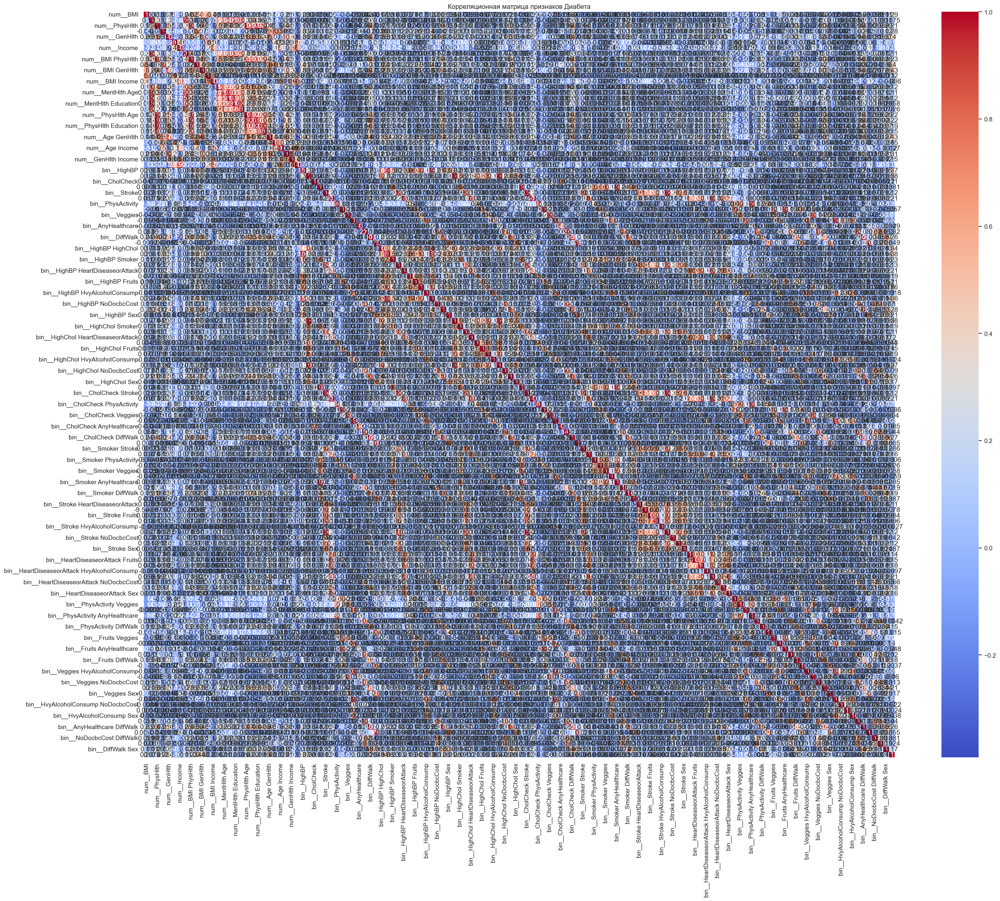

Корреляции с Диабетом:
Diabetes_binary                            1.000000
num__Age GenHlth                           0.432494
num__BMI GenHlth                           0.426158
num__BMI Age                               0.399280
num__GenHlth                               0.399201
bin__HighBP CholCheck                      0.376901
bin__HighBP                                0.374327
bin__HighBP AnyHealthcare                  0.358483
bin__HighBP HighChol                       0.341358
num__GenHlth Education                     0.307370
num__BMI                                   0.289527
bin__HighChol CholCheck                    0.283867
bin__HighChol                              0.279233
bin__HighBP DiffWalk                       0.278927
num__Age                                   0.276154
bin__HighChol AnyHealthcare                0.268425
bin__CholCheck DiffWalk                    0.266138
bin__DiffWalk                              0.263525
bin__HighBP Veggies                      

In [146]:
corrt = ct
corrt['Diabetes_binary'] = df['Diabetes_binary']
correlation_matrix = ct.corr()

# Визуализируйте корреляционную матрицу с помощью тепловой карты
plt.figure(figsize=(10*3, 8 * 3))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.title("Корреляционная матрица признаков Диабета")
plt.show()

# Выведите корреляции с ценой
print("Корреляции с Диабетом:")
print(correlation_matrix["Diabetes_binary"].sort_values(ascending= False).head(50))

In [102]:
# numeric_features = ['BMI', 'MentHlth', 'PhysHlth', 'Age', 'GenHlth', 'Education', 'Income']
# #category = ['GenHlth', 'Education', 'Income']
# num = Pipeline(steps=[
#     ('missing_num', KNNImputer()),
# #    ('bin', KBinsDiscretizer(n_bins = 3, strategy = 'uniform', encode = 'onehot-dense')),
#     ('scaler', MinMaxScaler())]) #StandardScaler()RobustScaler
# # cat_transformer = Pipeline(steps=[
# #     ('missing_num', SimpleImputer(strategy='most_frequent')),
# #     ('ce', ce.OrdinalEncoder()),
# #     ('scaler', MinMaxScaler())
# #     ])  
# CT = ColumnTransformer([
#     ("num", num, numeric_features)
# #    ("categ", cat_transformer, category)
#     ], force_int_remainder_cols=False, remainder='passthrough').set_output(transform='pandas')
# display(CT)


# ct = CT.fit_transform(X_train)
# pd.DataFrame(ct).head().T

In [12]:

pipe = Pipeline(steps=[
  ('preproc', CT),
  ('pca', PCA(n_components=2))
])
pipe.fit(X_train)
X_pca = pipe.transform(X_train)


In [109]:

pos_label, neg_label = 1, 0  # 1 обозначает диабет, 0 — отсутствие диабета

def fpr_score(y, y_pred, neg_label, pos_label):
    cm = confusion_matrix(y, y_pred, labels=[neg_label, pos_label])
    tn, fp, _, _ = cm.ravel()
    tnr = tn / (tn + fp) if (tn + fp) > 0 else 0 #Обработка деления на ноль
    return 1 - tnr

tpr_score = recall_score  # TPR и recall — это одна и та же метрика

scoring = {
    "precision": make_scorer(precision_score, pos_label=pos_label),
    "recall": make_scorer(recall_score, pos_label=pos_label),
    "fpr": make_scorer(fpr_score, neg_label=neg_label, pos_label=pos_label),
    "tpr": make_scorer(tpr_score, pos_label=pos_label),
}


def diabetes_gain_score(y, y_pred, neg_label, pos_label):
    """Пользовательская функция оценки, сильнее штрафующая пропущенные диагнозы диабета."""
    cm = confusion_matrix(y, y_pred, labels=[neg_label, pos_label])
    # Штраф за ложноотрицательные результаты (пропущенный диабет) в два раза больше, чем за ложноположительные
    gain_matrix = np.array(
        [
            [0, -1],  # -1 балл за ложноположительные результаты (предсказание диабета, когда его нет)
            [-2, 0],  # -2 балла за ложноотрицательные результаты (пропуск диабета)
        ]
    )
    return np.sum(cm * gain_matrix)


scoring["diabetes_gain"] = make_scorer(
    diabetes_gain_score, neg_label=neg_label, pos_label=pos_label
)

print(scoring)


{'precision': make_scorer(precision_score, response_method='predict', pos_label=1), 'recall': make_scorer(recall_score, response_method='predict', pos_label=1), 'fpr': make_scorer(fpr_score, response_method='predict', neg_label=0, pos_label=1), 'tpr': make_scorer(recall_score, response_method='predict', pos_label=1), 'diabetes_gain': make_scorer(diabetes_gain_score, response_method='predict', neg_label=0, pos_label=1)}


Метрика: -4527


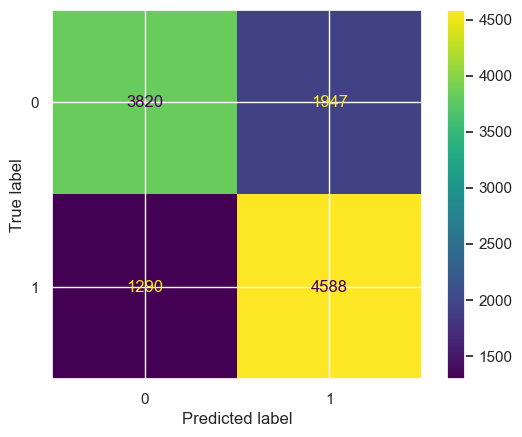

In [110]:

best_forest = Pipeline(steps=[
  ('preproc', CT),
  ('pca', PCA(n_components=0.9)),
  ('estimator', RandomForestClassifier(n_estimators=1000, max_features='log2', n_jobs = -1, min_samples_leaf = 25, random_state=0, oob_score = True))
])
best_forest.fit(X_train, y_train)
print(f"Метрика: {scoring['diabetes_gain'](best_forest, X_test, y_test)}")

best_forest.fit(X_train, y_train)
y_pred = best_forest.predict(X_test)

ConfusionMatrixDisplay(confusion_matrix(y_test,y_pred)).plot();

In [159]:
min_features = 1
max_features = 133
from collections import OrderedDict
ensemble_clfs = [
    (
        "RandomForestClassifier, gini",
        RandomForestClassifier(
            criterion='gini',
             min_samples_leaf = 25,
            n_jobs = -1,
            oob_score=True,
            random_state=0,
        ),
    ),
    (
        "RandomForestClassifier, entropy",
        RandomForestClassifier(
            criterion='entropy',
             min_samples_leaf = 5,
            n_jobs = -1,
            oob_score=True,
            random_state=0,
        ),
    )
]

# Сопоставляем имя классификатора со списком пар (<n_estimators>, <коэффициент ошибок>).
error_rate = OrderedDict((label, []) for label, _ in ensemble_clfs)

for label, clf in ensemble_clfs:
    for i in range(min_features, max_features + 1):
        clf.set_params(n_estimators = 500, max_features = i)
        clf.fit(X_train, y_train)

        # Запишем ошибку OOB для каждой настройки `n_estimators=i`.
        oob_error = 1 - clf.oob_score_
        error_rate[label].append((i, oob_error))

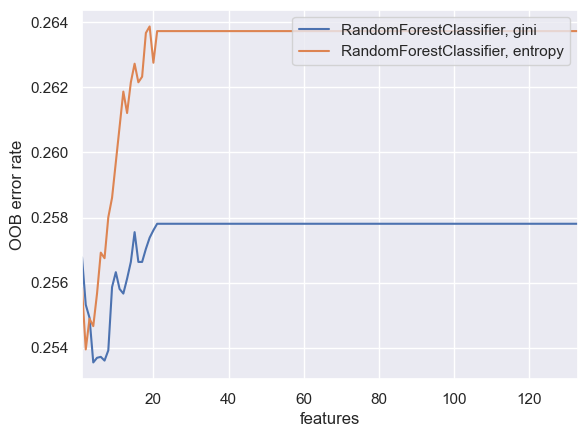

In [160]:
for label, clf_err in error_rate.items():
    xs, ys = zip(*clf_err)
    plt.plot(xs, ys, label=label)

plt.xlim(min_features, max_features)
plt.xlabel("features")
plt.ylabel("OOB error rate")
plt.legend(loc="upper right")
plt.show()

**ЛУЧШАЯ ИЗ ХУДШИХ**


In [205]:
best_forest1 = Pipeline(steps=[
  ('preproc', CT),
 # ('pca', PCA(n_components=0.9)),
  ('estimator', RandomForestClassifier(n_estimators=1000, criterion = 'gini', n_jobs = -1, min_samples_leaf = 20, max_features=15, oob_score = True))
])
best_forest1.fit(X_train, y_train)
print(f"Метрика: {scoring['diabetes_gain'](best_forest1, X_test, y_test)}")
y_pred = best_forest1.predict(X_test)

Метрика: -4184


In [206]:
best_forest2 = Pipeline(steps=[
  ('preproc', CT),
 # ('pca', PCA(n_components=0.9)),
  ('estimator', RandomForestClassifier(n_estimators=1000, criterion = 'gini', n_jobs = -1, min_samples_leaf = 17, max_features=21, oob_score = True))
])
best_forest2.fit(X_train, y_train)
print(f"Метрика: {scoring['diabetes_gain'](best_forest2, X_test, y_test)}")
y_pred = best_forest2.predict(X_test)

Метрика: -4219


In [207]:
best_forest3 = Pipeline(steps=[
  ('preproc', CT),
 # ('pca', PCA(n_components=0.9)),
  ('estimator', RandomForestClassifier(n_estimators=1000, n_jobs = -1, min_samples_leaf = 25, max_features=11, oob_score = True))
])
best_forest3.fit(X_train, y_train)
print(f"Метрика: {scoring['diabetes_gain'](best_forest3, X_test, y_test)}")
y_pred = best_forest3.predict(X_test)

Метрика: -4169


In [19]:
# def custom_scorer_with_threshold(estimator, X, y, threshold):
#     y_prob = estimator.predict_proba(X)
#     y_pred = np.where(y_prob[:, 1] >= threshold, 1, 0)  # Binary classification assumed
#     return f_sqrt2_score(y, y_pred)

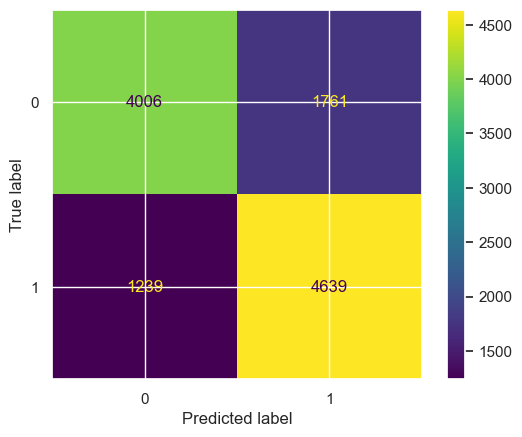

In [23]:
# best_forest1.fit(X_train, y_train)
# y_pred1 = best_forest1.predict(X_test)

# ConfusionMatrixDisplay(confusion_matrix(y_test,y_pred1)).plot();

In [195]:

def custom_metric(y_true, y_pred):
    """
    Вычисляет кастомную метрику: TP / ((2*FN + FP)*1/3 + TP)
    """
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()
    denominator = (2 * fn + fp) * (1/3) + tp
    if denominator == 0: #Обработка деления на ноль
        return 0
    return tp / denominator


In [209]:
best_forest2.fit(X_train, y_train)
y_pred_proba = best_forest2.predict_proba(X_test)[:, 1] 
threshold = 0.3  
y_pred = (y_pred_proba >= threshold).astype(int)
print(custom_metric(y_test, y_pred))
fbeta_score(y_test, y_pred, beta = np.sqrt(2))

0.8169258195503615


0.8169258195503617

In [200]:
thresholds = np.arange(0, 1.01, 0.01)  # Thresholds from 0 to 1 with a step of 0.01
results = []

for threshold in thresholds:
    y_pred_proba = best_forest1.predict_proba(X_test)[:, 1]
    y_pred = (y_pred_proba >= threshold).astype(int)
    custom_metric_result = custom_metric(y_test, y_pred)
    fbeta = fbeta_score(y_test, y_pred, beta=np.sqrt(2))
    results.append([threshold, custom_metric_result, fbeta])

#Convert results to a DataFrame for better viewing (optional but recommended)
results_df = pd.DataFrame(results, columns=['Threshold', 'Custom Metric', 'Fbeta (beta=sqrt(2))'])
print(results_df)

# Find the best threshold based on your preferred metric
best_threshold_custom = results_df.loc[results_df['Custom Metric'].idxmax()] #example - best threshold based on custom metric
best_threshold_fbeta = results_df.loc[results_df['Fbeta (beta=sqrt(2))'].idxmax()] #example - best threshold based on fbeta score
print("Best threshold based on custom metric:", best_threshold_custom)
print("Best threshold based on Fbeta(beta=sqrt(2)):", best_threshold_fbeta)

     Threshold  Custom Metric  Fbeta (beta=sqrt(2))
0         0.00       0.752407              0.752407
1         0.01       0.757598              0.757598
2         0.02       0.762335              0.762335
3         0.03       0.766169              0.766169
4         0.04       0.769312              0.769312
..         ...            ...                   ...
96        0.96       0.001279              0.001279
97        0.97       0.000000              0.000000
98        0.98       0.000000              0.000000
99        0.99       0.000000              0.000000
100       1.00       0.000000              0.000000

[101 rows x 3 columns]
Best threshold based on custom metric: Threshold               0.300000
Custom Metric           0.816832
Fbeta (beta=sqrt(2))    0.816832
Name: 30, dtype: float64
Best threshold based on Fbeta(beta=sqrt(2)): Threshold               0.300000
Custom Metric           0.816832
Fbeta (beta=sqrt(2))    0.816832
Name: 30, dtype: float64


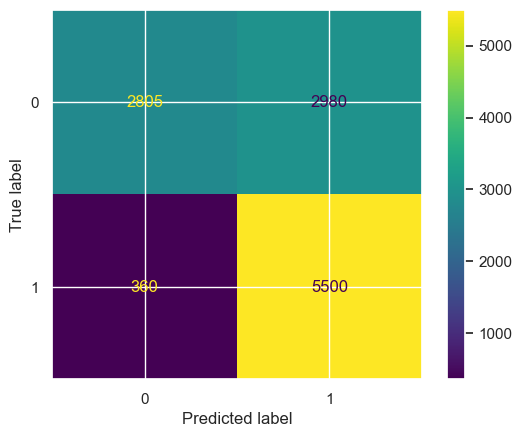

In [202]:
ConfusionMatrixDisplay(confusion_matrix(y_test,y_pred)).plot();
